# ----------------------- TIM Python Client - Quick Forecast -----------------------

# 0. Setup

Import the libraries necessary to run this notebook and set up the python client for TIM.
Make sure to fill in your credentials for TIM in the JSON file.

In [2]:
import pandas as pd
import json
import plotly as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as splt

In [13]:
import tim
tim_credentials = json.load(open('tim_credentials.json'))
client = tim.Tim(email=tim_credentials['email'],password=tim_credentials['password'])

# 1. Data Preparation

In this example we use the Belgian Electricity Grid dataset which is already preprocessed for use with TIM.
The dataframe tim_dataset is what will eventually be sent to TIM. If you wish to adapt this file you can apply the necessary transformations here.
The final dataframe is then visualized below in both a graph and a table.

In [21]:
csv_df = pd.read_csv('belgian_electricity_grid.csv')

In [15]:
tim_dataset = csv_df.copy()
timestamp = 'timestamp'
target = 'quantity'
predictors = [s for s in list(tim_dataset.columns) if s not in [timestamp,target]]
tim_dataset = tim_dataset[[timestamp,target]+predictors].reset_index(drop=True)

In [16]:
v_data = tim_dataset
fig = splt.make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.02)
fig.add_trace(go.Scatter(x=v_data[timestamp], y=v_data[target], name=target,connectgaps=True), row=1, col=1)
for idx, p in enumerate(predictors): fig.add_trace(go.Scatter(x=v_data[timestamp], y=v_data[p], name=p,connectgaps=True), row=2, col=1)
fig.update_layout(height=600, width=1200, title_text="Data visualization")
fig.show()    

In [17]:
tim_dataset

,timestamp,quantity,temp,feels_like,pressure,humidity,wind_speed,wind_deg,rain,snow,clouds,dew_point,wind_gust,visibility,public_holiday,school_holiday,holiday_period
0,2021-01-20 00:00:00,9850.0,6.37,-0.83,1005,81,8.23,210,0.0,0.0,75,3.35,0.00,10000.0,0,0,0
1,2021-01-20 01:00:00,9446.0,6.71,-0.59,1005,76,8.23,200,0.0,0.0,75,2.78,0.00,10000.0,0,0,0
2,2021-01-20 02:00:00,9176.0,6.74,-1.11,1004,81,9.26,210,0.5,0.0,100,3.71,0.00,10000.0,0,0,0
3,2021-01-20 03:00:00,9179.0,6.88,-0.95,1003,81,9.26,210,0.0,0.0,0,3.85,0.00,10000.0,0,0,0
4,2021-01-20 04:00:00,9346.0,7.38,0.92,1002,76,7.20,200,0.0,0.0,75,3.43,0.00,10000.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8731,2022-01-18 19:00:00,NaN,3.83,2.07,1035,91,1.94,101,0.0,0.0,5,2.35,2.20,10000.0,0,0,0
8732,2022-01-18 20:00:00,NaN,3.49,3.49,1035,91,1.28,90,0.0,0.0,4,2.03,1.31,10000.0,0,0,0
8733,2022-01-18 21:00:00,NaN,3.26,1.99,1034,91,1.48,89,0.0,0.0,3,1.85,1.48,10000.0,0,0,0
8734,2022-01-18 22:00:00,NaN,3.00,1.83,1034,92,1.39,93,0.0,0.0,4,1.62,1.37,10000.0,0,0,0


In [24]:
tim_dataset.dtypes

timestamp          object
quantity          float64
temp              float64
feels_like        float64
pressure            int64
humidity            int64
wind_speed        float64
wind_deg            int64
rain              float64
snow              float64
clouds              int64
dew_point         float64
wind_gust         float64
visibility        float64
public_holiday      int64
school_holiday      int64
holiday_period      int64
dtype: object

# 2. TIM Setup

The configuration below shows you all the options you have for setting up a forecast job with TIM. As you can see there are many possibilities however, TIM will by default already apply quite a lot of settings for you automatically. In this example we only set the "predictionTo" to "24" to generate a 24 sample ahead forecast and we'll set the "outOfSampleRows" to 24 x 7 x 10 = 1680 samples to apply backtesting on the last 10 weeks of the dataset. All other parameters are commented (#) which means TIM will assume default settings for these parameters.

In [18]:
forecast_build_model_configuration = {
#             "name": "My first forecast job",
#             "useCase": {"id":"61267a4c-a62e-495e-a237-8bc1b4f09a3b"},
#             "experiment": {"id":"experimentId"},
            "configuration": {
                "predictionTo": {"baseUnit": "Sample","value": 24},
#                 "predictionFrom": {"baseUnit": "Sample","value": 1},
#                 "modelQuality": "Combined",
#                 "normalization": True,
#                 "maxModelComplexity": 50,
#                 "features": [
#                    "ExponentialMovingAverage",
#                     "RestOfWeek",
#                     "Periodic",
#                     "Intercept",
#                     "PiecewiseLinear",
#                     "TimeOffsets",
#                     "Polynomial",
#                     "Identity",
#                     "PublicHolidays",      
#                     "SimpleMovingAverage",
#                     "Month",
#                     "Trend",
#                     "DayOfWeek",
#                     "Fourier",
#                     ],
#                 "dailyCycle": False,
#                 "allowOffsets": True,
#                 "offsetLimit": {"type": "Explicit","value": 0},
#                 "memoryLimitCheck": True,
#                  "predictionIntervals": 90,
#                  "predictionBoundaries": {"type": "Explicit",
#                      "maxValue": 750,
#                     "minValue": 100
#                      },
#                 "rollingWindow": {"baseUnit": "Sample","value": 1},
#                 "backtest": "All"
                },
            "data": {
#                 "version": {"id":"versionId"},
#                 "inSampleRows": {"baseUnit": "Sample","value": 1}, # or [{"from": "yyyy-mm-dd HH:MM:SS","to": "yyyy-mm-dd HH:MM:SS"}]
                "outOfSampleRows": {"baseUnit": "Sample","value": 24*7*10}, # or [{"from": "yyyy-mm-dd HH:MM:SS","to": "yyyy-mm-dd HH:MM:SS"}]
#                 "imputation": {"type": "Linear","maxGapLength": 6},
#                 "columns": [
#                     1,
#                     3,
#                     "wind"
#                     ],
#                 "targetColumn": "y",
#                 "holidayColumn": holidayColumn,
#                 "timeScale": {"baseUnit": "Hour","value": 1},
#                 "aggregation": "Mean",
#                 "alignment": {
#                     "lastTargetTimestamp": {},
#                     "dataUntil": [
#                         {"baseUnit": "Hour","offset": -2,"column": "Sales"}
#                     ]
#                 },
#                 "preprocessors": [
#                     {"type": "CategoryFilter"}
#                 ]
            }
}

In [19]:
forecast_build_model_configuration

{'configuration': {'predictionTo': {'baseUnit': 'Sample', 'value': 24}},
 'data': {'outOfSampleRows': {'baseUnit': 'Sample', 'value': 1680}}}

# 3. API Call

In this section we communicate with TIM. The quick_forecast method allows you to take several steps in the model building process at once.  
The most important inputs to this method are the dataset and job configuration which we created in the previous sections.  
The method has the following capabilities:  
1. Upload a dataset
2. Register a forecasting build model job
3. Execute a forecasting build model job.
4. Wait for the job to finish.
5. Collect results from the finished job from the API.
6. Delete all items from TIM.  
  
With this the user has a lot of flexibility in experimenting on different datasets. Running the following method will create a new use case in the default workspace. To specify a workspace and organize your work you can provide a valid TIM workspace id.

In [20]:
quick_forecast = client.quick_forecast(
    dataset = tim_dataset,
    job_configuration = forecast_build_model_configuration,
    workspace_id = None,
    dataset_configuration = {},
    execute = True,
    wait_to_finish = True,
    outputs = [
      'id',
      'details',
      'logs',
      'status',
      'table',
      'production_forecast',
      'model',
      'accuracies',
      'production_table',
      'production_accuracies'
      ],
    status_poll = print,
    tries_left = 300,
    delete_items = False
 )

{'status': 'Running', 'progress': 0.0, 'createdAt': '2023-02-19T12:34:37.921Z'}
{'status': 'Running', 'progress': 87.94, 'createdAt': '2023-02-19T12:34:37.921Z'}
{'status': 'Finished', 'progress': 100.0, 'createdAt': '2023-02-19T12:34:37.921Z'}
{'status': 'Running', 'createdAt': '2023-02-19T12:34:44.526Z'}
{'status': 'Running', 'progress': 20.0, 'CPU': 0.13, 'memory': 2915.0, 'createdAt': '2023-02-19T12:34:49.055Z'}
{'status': 'Running', 'progress': 21.67, 'CPU': 0.2, 'memory': 3008.0, 'createdAt': '2023-02-19T12:34:50.948Z'}
{'status': 'Running', 'progress': 22.38, 'CPU': 0.2, 'memory': 3091.0, 'createdAt': '2023-02-19T12:34:52.004Z'}
{'status': 'Running', 'progress': 24.78, 'CPU': 0.19, 'memory': 3377.0, 'createdAt': '2023-02-19T12:34:55.547Z'}
{'status': 'Running', 'progress': 34.39, 'CPU': 0.19, 'memory': 3353.0, 'createdAt': '2023-02-19T12:34:58.131Z'}
{'status': 'Running', 'progress': 39.19, 'CPU': 0.19, 'memory': 3354.0, 'createdAt': '2023-02-19T12:34:59.633Z'}
{'status': 'Runni

In [10]:
quick_forecast_upload = quick_forecast.upload_response
quick_forecast_response = quick_forecast.forecast_response
quick_forecast_delete = quick_forecast.delete_response

In [11]:
quick_forecast_id = quick_forecast_response.id
quick_forecast_details = quick_forecast_response.details
quick_forecast_logs = quick_forecast_response.logs
quick_forecast_status = quick_forecast_response.status
quick_forecast_table = quick_forecast_response.table
quick_forecast_production_forecast = quick_forecast_response.production_forecast
quick_forecast_model = quick_forecast_response.model
quick_forecast_accuracies = quick_forecast_response.accuracies
quick_forecast_production_table = quick_forecast_response.production_table
quick_forecast_production_accuracies = quick_forecast_response.production_accuracies

# 4. Collect Results

After the job is finished you can collect your results and insights from TIM using the functions below.
You can use these tables with TIM outputs and adapt them to your needs.

In [22]:
properties_df = tim.postProcess.properties(quick_forecast_model)
features_df = tim.postProcess.features(quick_forecast_model)
for i in quick_forecast_table['forecast_type'].unique(): quick_forecast_table.loc[quick_forecast_table['forecast_type']==i, i] = quick_forecast_table['forecast']
accuracy_df = tim.postProcess.forecast_accuracy_table(quick_forecast_accuracies)
job_logs_df = pd.DataFrame(quick_forecast_logs).sort_values(by='createdAt').reset_index(drop=True)
quick_forecast_table['MAE'] = abs(quick_forecast_table['forecast']-quick_forecast_table['target'])

# 5. Visualize Results

Images below show how TIM results can be easily visualized in Python with Plotly. You can visualize the predictions, the accuracy values calculated by TIM, the predictor and feature importances and other insights.

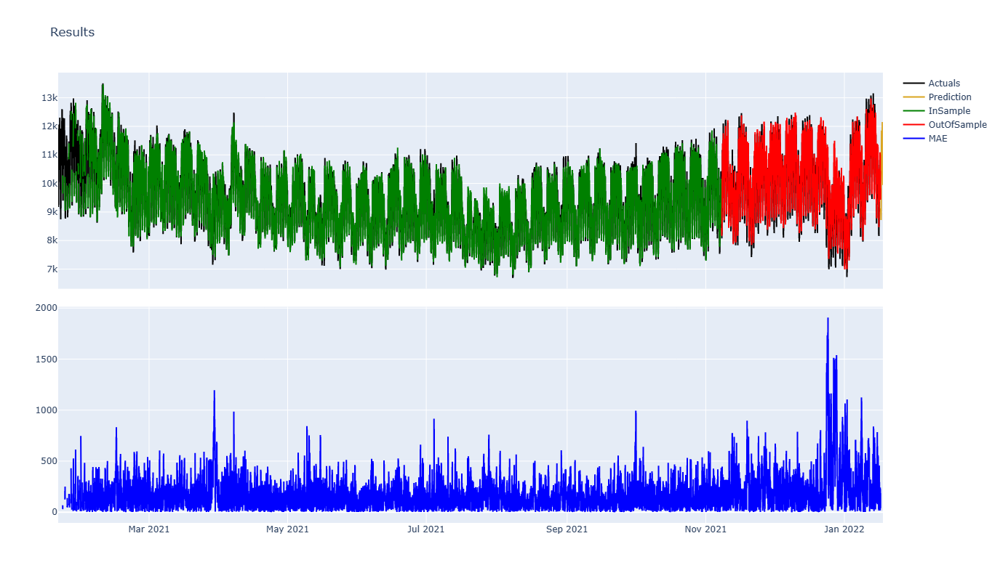

In [25]:
v_data = quick_forecast_table
fig = plt.subplots.make_subplots(rows=2, cols=1, vertical_spacing=0.04,shared_xaxes=True)
fig.add_trace(go.Scatter(x=v_data['timestamp'], y=v_data['target'], name='Actuals', line=dict(color='black')), row=1, col=1)
fig.add_trace(go.Scatter(x=v_data['timestamp'], y=v_data['Production'], name='Prediction', line=dict(color='goldenrod')), row=1, col=1)
# fig.add_trace(go.Scatter(x=v_data['timestamp'], y=v_data['lower_bound'], name='Lower bound', line=dict(color='lightgrey')), row=1, col=1)
# fig.add_trace(go.Scatter(x=v_data['timestamp'], y=v_data['upper_bound'], name='Upper bound', line=dict(color='lightgrey')), row=1, col=1)
fig.add_trace(go.Scatter(x=v_data['timestamp'], y=v_data['InSample'], name='InSample', line=dict(color='green')), row=1, col=1)
fig.add_trace(go.Scatter(x=v_data['timestamp'], y=v_data['OutOfSample'], name='OutOfSample', line=dict(color='red')), row=1, col=1)
fig.add_trace(go.Scatter(x=v_data['timestamp'], y=v_data['MAE'], name='MAE', line=dict(color='blue')), row=2, col=1)
fig.update_layout(height=800, width=1200, title_text="Results")
fig.show()

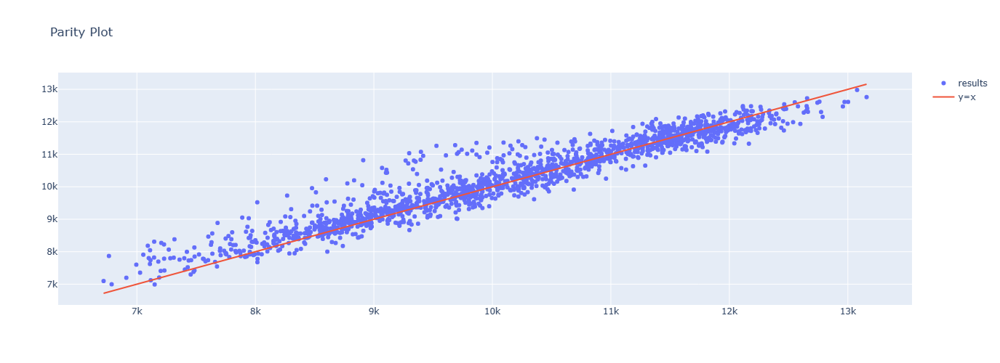

In [26]:
v_data = quick_forecast_table[['target','OutOfSample']].dropna()
x_axis = 'target'
y_axis = 'OutOfSample'
max_x = max(v_data[x_axis].max(),v_data[y_axis].max())
min_x = min(v_data[x_axis].min(),v_data[y_axis].min())
fig = go.Figure()
fig.add_trace(go.Scatter(x=v_data[x_axis], y=v_data[y_axis],mode='markers',name='results'))
fig.add_trace(go.Scatter(x=[min_x,max_x], y=[min_x,max_x],mode='lines',name='y=x'))
fig.update_layout(height=500, width=1200, title_text="Parity Plot")
fig.show()

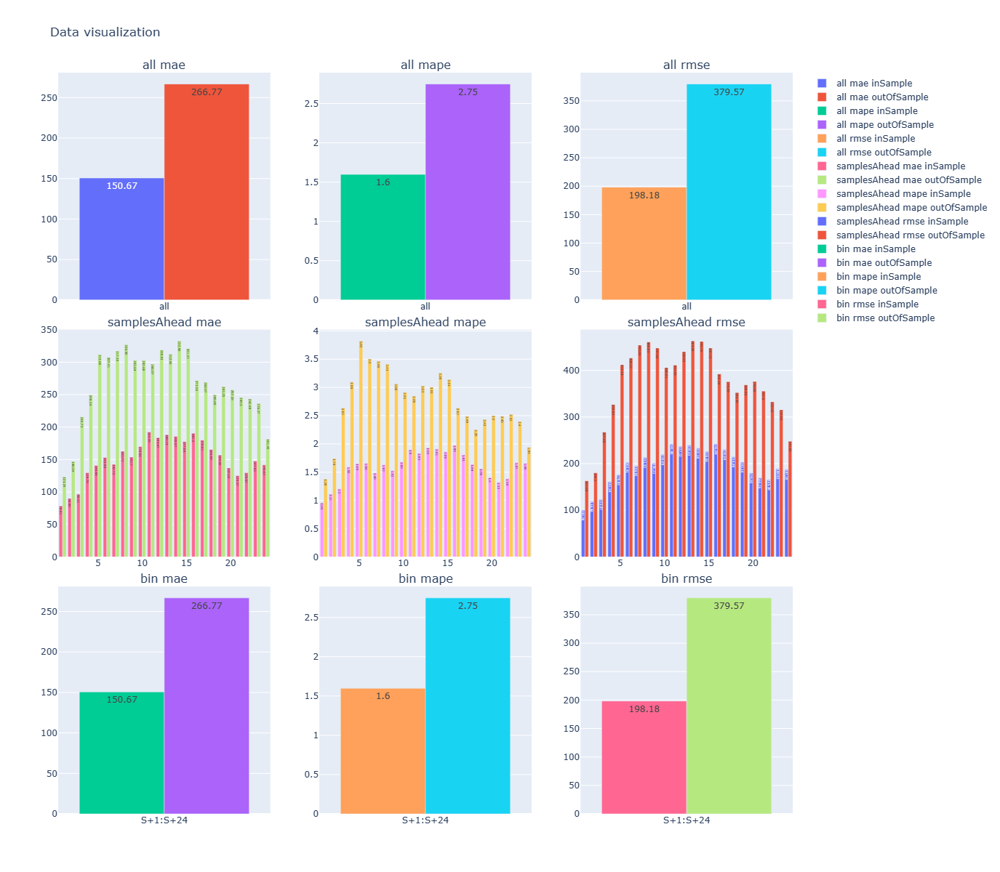

In [63]:
rows = accuracy_df.dropna()['accuracy_type'].unique()
columns = accuracy_df.dropna()['KPI'].unique()
variable = sorted(accuracy_df.dropna()['variable'].unique())
subplot_titles = []
for i in rows:
    for j in columns: subplot_titles.append(str(i)+" "+str(j))
fig = plt.subplots.make_subplots(rows=len(rows), cols=len(columns), vertical_spacing=0.04,subplot_titles=subplot_titles)

for r,i in enumerate(rows):
    for c,j in enumerate(columns):
        v_data = accuracy_df[(accuracy_df['KPI']==j)&(accuracy_df['accuracy_type']==i)].pivot(index=['KPI','name','accuracy_type'], columns='variable', values='value').reset_index()
        try:
            v_data['name'] = v_data['name'].astype(float)
            v_data.sort_values(by='name',inplace=True)
        except:
            pass
        for v,k in enumerate(variable):
            fig.add_trace(go.Bar(x=v_data['name'], y=v_data[k], name=str(i)+" "+str(j)+" "+str(k),text=round(v_data[k],2),textposition='auto'), row=r+1, col=c+1)
fig.update_layout(height=1200, width=1400, title_text="Data visualization",)
fig.show()

Predictors not used:['feels_like', 'wind_deg', 'rain', 'holiday_period']


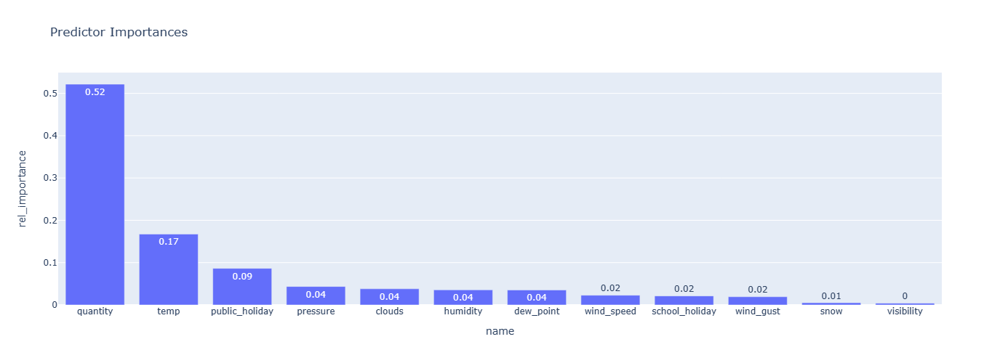

In [64]:
b_v_df = properties_df[properties_df['importance']>0]
x_axis = 'name'
y_axis = 'rel_importance'

fig1 = go.Figure(go.Bar(x=b_v_df[x_axis], y=b_v_df[y_axis],text=round(b_v_df[y_axis],2),textposition='auto'))
fig1.update_layout(height=500,width=1200,title_text='Predictor Importances',xaxis_title=x_axis,yaxis_title=y_axis)
print('Predictors not used:'+str(list(properties_df[~(properties_df['importance']>0)]['name'])))
fig1.show()

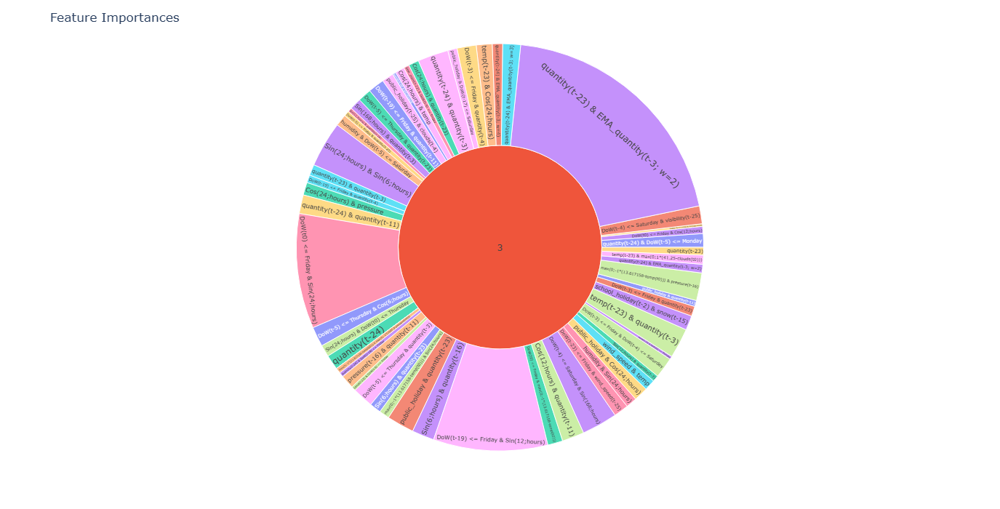

In [65]:
fig = px.sunburst(features_df, path=['Model','Feature'], values='importance',color='Feature')
fig.update_layout(height=700,width=700,title_text='Feature Importances')
fig.update_traces(sort=False, selector=dict(type='sunburst')) 
fig.show()

In [66]:
job_logs_df

,message,messageType,createdAt,origin
0,Expected result table size is 0.82 MiB.,Info,2023-01-17T11:06:06.535Z,Registration
1,The job is categorized as light.,Info,2023-01-17T11:06:06.535Z,Registration
2,Queued by fa4b9fce-f6f6-4f07-bab1-5814a537c413.,Info,2023-01-17T11:06:06.836Z,Execution
3,Job execution posted to queue with priority 4.,Info,2023-01-17T11:06:08.795Z,Execution
4,Handling request...,Info,2023-01-17T11:06:08.825Z,Execution
5,"Executing job ""7f1bac5d-3db2-4d86-9862-33bae7d...",Info,2023-01-17T11:06:08.852Z,Execution
6,"Forecast job, type: model building and predict...",Info,2023-01-17T11:06:09.051Z,Execution
7,"Getting data from dataset version ""6790894b-03...",Info,2023-01-17T11:06:09.185Z,Execution
8,The outOfSampleRows overlap with inSampleRows....,Warning,2023-01-17T11:06:11.205Z,Execution
9,TIM will consider this dataset to be daily-cyc...,Info,2023-01-17T11:06:11.348Z,Execution


In [23]:
warnings = list(job_logs_df[job_logs_df['messageType'] == "Warning"]['message'])
warnings

['The outOfSampleRows overlap with inSampleRows. Timestamps in the intersection will be used as outOfSample timestamps.']

# 6. Save Results
To save the outputs from TIM use the cells below. You can also find a summary of all the other functions in the Python Client for TIM below.   
For more information visit https://pypi.org/project/tim-client/ or our documentation https://docs.tangent.works/docs/TIM-Clients/Python-Client/Overview.

In [24]:
# quick_forecast_table.to_csv('quick_forecast_table.csv',index=False, float_format='%g')
# accuracy_df.to_csv('accuracy_df.csv',index=False, float_format='%g')
# properties_df.to_csv('properties_df.csv',index=False, float_format='%g')
# features_df.to_csv('features_df.csv',index=False, float_format='%g')
# job_logs_df.to_csv('job_logs_df.csv',index=False, float_format='%g')
# json.dump(quick_forecast_model,open("quick_forecast_model.json", "w"))